In [1]:
from __future__ import annotations
import time
import tkinter
import pathlib
import pickle
import tifffile
import os
import numpy as np
from PIL import (Image, ImageTk, ImageDraw)
from tkinter import filedialog, messagebox
from matplotlib.figure import Figure 
from matplotlib.backends.backend_tkagg import (FigureCanvasTkAgg, NavigationToolbar2Tk)
from matplotlib.patches import Rectangle, Circle
from matplotlib.backend_bases import MouseEvent
from matplotlib.path import Path
from matplotlib.patches import PathPatch
import matplotlib.pyplot as plt
from skimage import measure
import fishCore
import fishGUI
import threading
import concurrent.futures
import cv2
import imageio.v3 as iio


f = fishCore.Fish(pathlib.Path("./config.ini"))
f.set_model_version("3.50")

c:\Users\tkpp2\miniconda3\envs\fish\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


final text_encoder_type: bert-base-uncased


[2025-10-25 15:46:10,578][INFO] CHECK: Model version 3.50 loaded


### Observing Different Masks

tif_files count: 18
example stems: ['MAXEXP250921COLC01_w1-DAPI_s001', 'MAXEXP250921COLC01_w1-DAPI_s002', 'MAXEXP250921COLC01_w1-DAPI_s003', 'MAXEXP250921COLC01_w1-DAPI_s004', 'MAXEXP250921COLC01_w1-DAPI_s005', 'MAXEXP250921COLC01_w1-DAPI_s006', 'MAXEXP250921COLC01_w2-AF555_s001', 'MAXEXP250921COLC01_w2-AF555_s002', 'MAXEXP250921COLC01_w2-AF555_s003', 'MAXEXP250921COLC01_w2-AF555_s004', 'MAXEXP250921COLC01_w2-AF555_s005', 'MAXEXP250921COLC01_w2-AF555_s006', 'MAXEXP250921COLC01_w3-AF488_s001', 'MAXEXP250921COLC01_w3-AF488_s002', 'MAXEXP250921COLC01_w3-AF488_s003', 'MAXEXP250921COLC01_w3-AF488_s004', 'MAXEXP250921COLC01_w3-AF488_s005', 'MAXEXP250921COLC01_w3-AF488_s006']
grouped keys: ['001', '002', '003', '004', '005', '006']
pos=001  channels=['488', '555', 'DAPI']
pos=002  channels=['488', '555', 'DAPI']
pos=003  channels=['488', '555', 'DAPI']
pos=004  channels=['488', '555', 'DAPI']
pos=005  channels=['488', '555', 'DAPI']
pos=006  channels=['488', '555', 'DAPI']
Using channel 555 f

DEBUG: DINO predicted 35 boxes


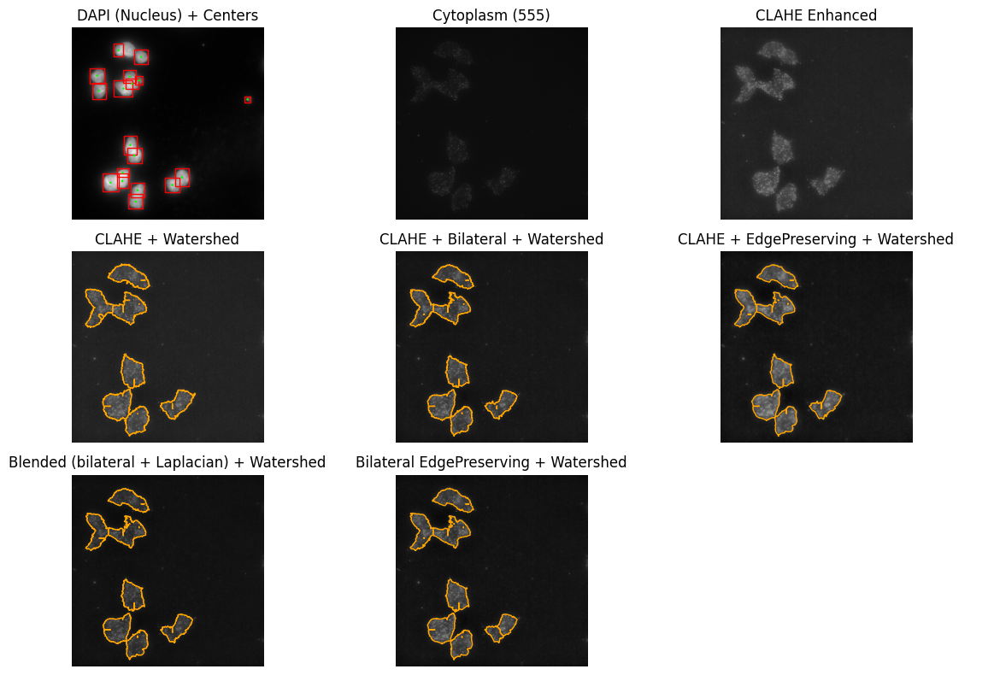

In [4]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import (
    denoise_tv_chambolle,
    denoise_bilateral,
    denoise_wavelet,
    estimate_sigma,
)
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def watershed_segment(cyt_img: np.ndarray,
                      centers: list[tuple[float,float]],
                      thresh_method: str = "otsu",
                      min_size: int = 300) -> list[np.ndarray]:
    if thresh_method == "otsu":
        thresh = filters.threshold_otsu(cyt_img)
    else:
        thresh = np.percentile(cyt_img, 30)
    
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    binary = morphology.remove_small_objects(binary, min_size=1000)

    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for idx, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = idx

    labels = segmentation.watershed(-dist, markers, mask=binary)

    masks = []
    for i in range(1, len(centers)+1):
        cell = (labels == i)
        cell = postproc_mask(cell)
        masks.append(cell)
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------
import re
data_dir = pathlib.Path(r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_555\EXP250921COLC01")
tif_files = list(data_dir.glob("*.tif"))
grouped = {}

for path in tif_files:
    stem = path.stem
    pos_match = re.search(r"s(\d+)", stem, re.IGNORECASE)
    chan_match = re.search(r"w[-_]?(?:.*?)?(DAPI|488|647|555|594)", stem, re.IGNORECASE)
    if not (pos_match and chan_match):
        continue
    pos = pos_match.group(1)
    chan = chan_match.group(1).upper()
    grouped.setdefault(pos, {})[chan] = path

# quick debug: what files were found and how they were grouped
print("tif_files count:", len(tif_files))
print("example stems:", [p.stem for p in tif_files[:20]])
print("grouped keys:", sorted(grouped.keys()))
for pos, channels in grouped.items():
    print(f"pos={pos}  channels={sorted(channels.keys())}")

# Pick a sample (e.g., 001)
sample_id = "001"
if sample_id not in grouped or "555" not in grouped[sample_id]:
    raise ValueError(f"Sample s{sample_id} missing required channels")

nucleus_path = grouped[sample_id]["DAPI"]
nucleus = tifffile.imread(nucleus_path)
nucleus = normalize_to_uint8(nucleus)
cyto_channel = "555"
cyto_path = grouped[sample_id][cyto_channel]
print(f"Using channel {cyto_channel} for cytoplasm")

ch = tifffile.imread(cyto_path)
ch = normalize_to_uint8(ch)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(ch, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

clahe = clahe_filter(ch)
# grad = gradient(clahe)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(clahe, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

bilat1 = cv2.bilateralFilter(clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=sigma_norm, borderType=cv2.BORDER_REFLECT_101)
edge_preserved = cv2.edgePreservingFilter(clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)

bilat_edge = cv2.edgePreservingFilter(bilat1, flags=1, sigma_s=sigma_weak, sigma_r=0.4)

laplacian = cv2.Laplacian(ch, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)
blended = cv2.addWeighted(bilat1, 0.8, laplacian, 0.2, 0)

# ----- BBoxes and Masks -----
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

masks_clahe = watershed_segment(clahe, centers)
# masks_grad = watershed_segment(grad, centers)
masks_bilat = watershed_segment(bilat1, centers)
masks_edge_preserved = watershed_segment(edge_preserved, centers)
masks_bilat_edge = watershed_segment(bilat_edge, centers)

# --------------------------------------
# Visualization
# --------------------------------------
# Visualization (fixed)
# --------------------------------------
fig, axes = plt.subplots(3, 3, figsize=(12, 8))

# ---- Row 0 ----
# (0,0) DAPI nucleus + centers
axes[0, 0].imshow(nucleus, cmap='gray')
axes[0, 0].set_title("DAPI (Nucleus) + Centers")
axes[0, 0].axis('off')
for (x1, y1, x2, y2) in bbox_nucleus:
    axes[0, 0].add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1,
                                   edgecolor='red', facecolor='none', linewidth=1))
for cx, cy in centers:
    axes[0, 0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

# (0,1) Cytoplasm original
axes[0, 1].imshow(ch, cmap='gray')
axes[0, 1].set_title(f"Cytoplasm ({cyto_channel})")
axes[0, 1].axis('off')

# (0,2) CLAHE enhanced
axes[0, 2].imshow(clahe, cmap='gray')
axes[0, 2].set_title("CLAHE Enhanced")
axes[0, 2].axis('off')

# ---- Row 1 ----
# CLAHE + Watershed
axes[1, 0].imshow(clahe, cmap='gray')
axes[1, 0].set_title("CLAHE + Watershed")
axes[1, 0].axis('off')
for mask in masks_clahe:
    for contour in measure.find_contours(mask, 0.5):
        axes[1, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# Bilateral (on CLAHE) + Watershed  <-- show bilat1 here
axes[1, 1].imshow(bilat1, cmap='gray')
axes[1, 1].set_title("CLAHE + Bilateral + Watershed")
axes[1, 1].axis('off')
for mask in masks_bilat:
    for contour in measure.find_contours(mask, 0.5):
        axes[1, 1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# EdgePreserving (on CLAHE) + Watershed  <-- show edge_preserved here
axes[1, 2].imshow(edge_preserved, cmap='gray')
axes[1, 2].set_title("CLAHE + EdgePreserving + Watershed")
axes[1, 2].axis('off')
for mask in masks_edge_preserved:
    for contour in measure.find_contours(mask, 0.5):
        axes[1, 2].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# ---- Row 2 ----
# Blended + Watershed
masks_blended = watershed_segment(blended, centers)
axes[2, 0].imshow(blended, cmap='gray')
axes[2, 0].set_title("Blended (bilateral + Laplacian) + Watershed")
axes[2, 0].axis('off')
for mask in masks_blended:
    for contour in measure.find_contours(mask, 0.5):
        axes[2, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# Bilateral EdgePreserving + Watershed
axes[2, 1].imshow(bilat_edge, cmap='gray')
axes[2, 1].set_title("Bilateral EdgePreserving + Watershed")
axes[2, 1].axis('off')
for mask in masks_bilat_edge:
    for contour in measure.find_contours(mask, 0.5):
        axes[2, 1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

axes[2, 2].axis('off')

plt.tight_layout()
plt.show()


### image Preprocessing Technique (488)

Estimated Gaussian noise standard deviation = 9.584996373412
Estimated Gaussian noise standard deviation = 31.300013231541765
DEBUG: Running dino_bbox
DEBUG: DINO predicted 55 boxes
[CYTO] Starting prediction for 12 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [400.0, 1754.0, 605.0, 1984.0]
[CYTO] Processing box [340.0, 906.0, 570.0, 1088.0]
[CYTO] Processing box [719.0, 414.0, 1078.0, 680.0]
[CYTO] Processing box [763.0, 809.0, 1069.0, 1077.0]
[CYTO] Processing box [1763.0, 483.0, 1967.0, 668.0]
[CYTO] Processing box [1639.0, 358.0, 1861.0, 563.0]
[CYTO] Processing box [1848.0, 574.0, 2047.0, 990.0]
[CYTO] Processing box [1154.0, 1558.0, 1454.0, 1805.0]
[CYTO] Processing box [726.0, 1165.0, 1170.0, 1868.0]
[CYTO] Processing box [243.0, 1427.0, 550.0, 1652.0]
[CYTO] Processing box [317.0, 0.0, 761.0, 521.0]
[CYTO] Processing box [1815.0, 1253.0, 2047.0, 1603.0]


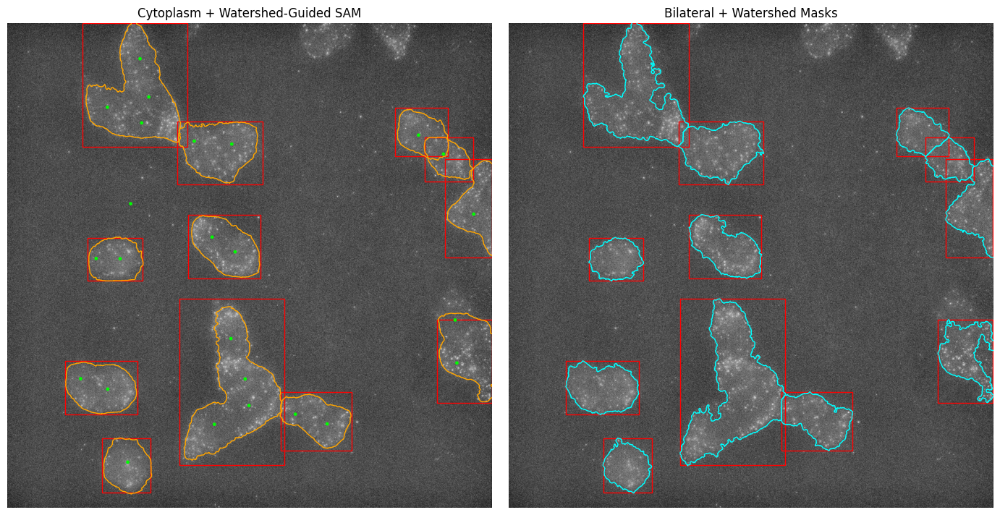

In [ ]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import (
    denoise_tv_chambolle,
    denoise_bilateral,
    denoise_wavelet,
    estimate_sigma,
)
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------
def remove_outliers(img, k=20.0, use_median=False):
    """
    Clip values that are more than k std-dev (or MAD units) above center.
    Args:
        img: 16-bit numpy array
        k: threshold (e.g. 3σ)
        use_median: if True use median+MAD, else mean+std
    Returns:
        clipped float32 image in [0,1]
    """
    x = img.astype(np.float32)

    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad  # robust std estimate
        thresh = med + k * sigma
    else:
        mean = np.mean(x)
        std = np.std(x)
        thresh = mean + k * std

    # clip outliers
    x_clipped = np.minimum(x, thresh)

    # normalize after clipping (to 0..1)
    x_norm = (x_clipped - x_clipped.min()) / (x_clipped.max() - x_clipped.min() + 1e-6)
    return x_norm

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def calculate_sigma(img):
    # ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
    sig = estimate_sigma(img, channel_axis=None, average_sigmas=True)
    print(f'Estimated Gaussian noise standard deviation = {sig}')
    return sig

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)
    return cyt_blended

def brightness(img, target_mean=70):
    mean_val = np.mean(img)

    # Compute needed offset (positive = brighten, negative = darken)
    offset = target_mean - mean_val
    # Build a constant image for addition
    adjustment = np.full(img.shape, offset, dtype=np.uint8) if offset > 0 else np.zeros_like(img)
    # Use cv.add to brighten, cv.subtract to darken
    if offset > 0:
        print("Brightness increased")
        result = cv2.add(img, adjustment)
    else:
        print("Brightness remained the same")
        result = img

    return result

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    # binary = morphology.remove_small_objects(binary, min_size=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------

# ----- COMPOSITE IMAGES -----
# image_path = pathlib.Path("C:/Users/msgal/Downloads/Ding_Lab/FISH-ML/Composite Images (Multi-Channel)/488_pb5sp4_s1.composite.tif")

# with tifffile.TiffFile(image_path) as tif:
#     cyt = tif.pages[0].asarray() # testing with 488
#     nucleus = tif.pages[1].asarray()

# ----- NON COMPOSITE IMAGES -----
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s001.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s001.tif" 

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray() # testing with 488

with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

cyt_removed = remove_outliers(cyt)
cyt_norm = normalize_to_uint8(cyt_removed)

sigma_est = calculate_sigma(cyt) # Calculate sigma

cyt_clahe = clahe_filter(cyt_norm) 

sigma_est = calculate_sigma(cyt_clahe)
sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15, borderType=cv2.BORDER_REFLECT_101)
cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)
cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)
cyt_blended = laplacian(cyt_norm, cyt_bilat)

# --------
# Stacking
# --------
cyt_rgb = np.stack([cyt_blended, cyt_bilat, cyt_edge_preserved], axis=-1)
bbox_nucleus = f.AppIntDINOwrapper(nucleus) 
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# --- Creating Masks ---
masks_bilat_edge = watershed_segment_with_centers(cyt_bilat_edge, centers)

# --- Creating BBoxes ---
bbox_cyto = [mask_to_bbox(m) for m in masks_bilat_edge]
bbox_cyto = [b for b in bbox_cyto if b is not None]
bbox_cyto = [
    [float(x1), float(y1), float(x2), float(y2)] 
    for (x1, y1, x2, y2) in bbox_cyto
]


# -----------------------------
# SAM segmentation guided by boxes
# -----------------------------
masks_all = f.finetune.AppIntPREDICTCytoplasmWrapper(cyt_rgb, bbox_cyto)

masks = []
for mset in masks_all:
    areas = [(mm > 0).sum() for mm in mset]
    best = mset[np.argmax(areas)]
    masks.append(postproc_mask(best))

# --------------------------------------
# Visualization
# --------------------------------------
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# ---------------------------
# LEFT: Cytoplasm + Watershed-Guided SAM
# ---------------------------
ax[0].imshow(cyt_clahe, cmap='gray')
ax[0].set_title("Cytoplasm + Watershed-Guided SAM")
ax[0].axis('off')

# Plot SAM-guided mask contours
for mask in masks:
    for contour in measure.find_contours(mask, 0.5):
        ax[0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# Plot bounding boxes (red)
for (x1, y1, x2, y2) in bbox_cyto:
    ax[0].add_patch(Rectangle(
        (x1, y1), x2 - x1, y2 - y1,
        edgecolor='red', facecolor='none', lw=1
    ))

# Plot centers (lime)
for (cx, cy) in centers:
    ax[0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))


# ---------------------------
# RIGHT: Bilateral + Watershed Masks
# ---------------------------
ax[1].imshow(cyt_clahe, cmap='gray')
ax[1].set_title("Bilateral + Watershed Masks")
ax[1].axis('off')

for mask in masks_bilat_edge:
    for contour in measure.find_contours(mask, 0.5):
        ax[1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# Optional: same red bounding boxes for comparison
for (x1, y1, x2, y2) in bbox_cyto:
    ax[1].add_patch(Rectangle(
        (x1, y1), x2 - x1, y2 - y1,
        edgecolor='red', facecolor='none', lw=1
    ))

plt.tight_layout()
plt.show()

### Image Preprocessing technique (647)

Using cytoplasm: C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s004.tif
Using nucleus: C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s004.tif
DEBUG: Running dino_bbox
DEBUG: DINO predicted 28 boxes
[WARNING] Empty mask at index 5
[WARNING] Empty mask at index 7
[WARNING] Empty mask at index 11
[WARNING] Empty mask at index 12
[CYTO] Starting prediction for 1 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint16
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1290.0, 1765.0, 1665.0, 1999.0]
[CYTO] Starting prediction for 1 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint16
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1227.0, 1612.0, 1420.0, 1814.0]
[CYTO] Starting prediction for 1 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint16
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [13

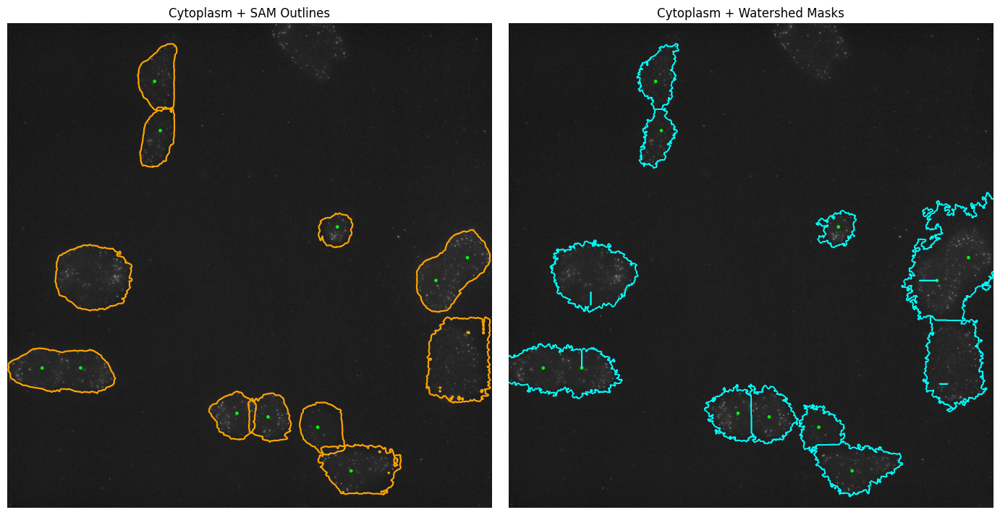

In [14]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi

# -----------------------------
# Helper functions
# -----------------------------
def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe(img, clip_limit=2.0, tile_size=(8, 8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def gradient(img, ksize=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
    return cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    binary = morphology.remove_small_objects(binary, min_size=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    elev = -dist + 5 * filters.sobel(cyt_img)
    labels = segmentation.watershed(elev, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels) + 1):
        m = (labels == i)
        if m.sum() > 0:
            masks.append(postproc_mask(m))
    return masks

def preprocess_nucleus_stack(stack: np.ndarray):
    stack = stack[np.any(stack > 0, axis=(1, 2))]  # remove empty slices
    proj = np.max(stack, axis=0)                   # max projection
    return normalize_to_uint8(proj)

def preprocess_cytoplasm_stack(stack: np.ndarray, top_n: int = 8):
    stack = stack[np.any(stack > 0, axis=(1, 2))]
    scores = [cv2.Laplacian(z, cv2.CV_64F).var() for z in stack]
    best_z = np.argsort(scores)[-top_n:]
    best_z.sort()
    proj = np.max(stack[best_z], axis=0)
    proj_8bit = normalize_to_uint8(proj)
    return clahe(proj_8bit)

# -----------------------------
# Specify image paths directly
# -----------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s004.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s004.tif"

print(f"Using cytoplasm: {cyt_path}")
print(f"Using nucleus: {nuc_path}")

# -----------------------------
# Load and preprocess
# -----------------------------
nucleus_stack = tifffile.imread(nuc_path)
nucleus = nucleus_stack

cyt_stack = tifffile.imread(cyt_path)
cyt_clahe = clahe(cyt_stack)
cyt_grad = gradient(cyt_clahe, ksize=5)
cyt_rgb = np.stack([cyt_clahe, cyt_clahe, cyt_grad], axis=-1)

bbox_nucleus = f.AppIntDINOwrapper(nucleus) or []
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# -----------------------------
# Watershed + SAM segmentation
# -----------------------------
watershed_masks = watershed_segment_with_centers(cyt_clahe, centers)

bbox_cyto = []
for i, m in enumerate(watershed_masks):
    bb = mask_to_bbox(m)
    if bb is not None:
        x1, y1, x2, y2 = bb
        bbox_cyto.append([float(x1), float(y1), float(x2), float(y2)])
    else:
        print(f"[WARNING] Empty mask at index {i}")

if not bbox_cyto:
    raise RuntimeError("No valid cytoplasm bounding boxes")

# Run SAM per-box with explicit truth-value check
final_masks = []
for box in bbox_cyto:
    mask_sets = f.finetune.AppIntPREDICTCytoplasmWrapper(cyt_rgb, [box])
    if mask_sets is not None and len(mask_sets) > 0:
        best = max(mask_sets[0], key=lambda m: m.sum())
        final_masks.append(postproc_mask(best))
    else:
        print(f"[WARNING] No SAM masks returned for box {box}")

# -----------------------------
# Visualization
# -----------------------------
# -----------------------------
# Visualization
# -----------------------------
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# LEFT: Cytoplasm + SAM Outlines
ax[0].imshow(cyt_clahe, cmap='gray')
ax[0].set_title("Cytoplasm + SAM Outlines")
ax[0].axis('off')
for mask in final_masks:
    for contour in measure.find_contours(mask, 0.5):
        ax[0].plot(contour[:, 1], contour[:, 0], linewidth=1.5, color='orange')

for (x1, y1, x2, y2), (cx, cy) in zip(bbox_cyto, centers):
    ax[0].add_patch(Circle((cx, cy), radius=5,
                           color='lime', fill=True))

# RIGHT: Cytoplasm + Watershed Masks
ax[1].imshow(cyt_clahe, cmap='gray')
ax[1].set_title("Cytoplasm + Watershed Masks")
ax[1].axis('off')
for mask in watershed_masks:
    for contour in measure.find_contours(mask, 0.5):
        ax[1].plot(contour[:, 1], contour[:, 0], linewidth=1.2, color='cyan')

for (x1, y1, x2, y2), (cx, cy) in zip(bbox_cyto, centers):
    ax[1].add_patch(Circle((cx, cy), radius=5,
                           color='lime', fill=True))

plt.tight_layout()
plt.show()




### Observing Each Steps

DEBUG: Running dino_bbox
DEBUG: DINO predicted 45 boxes
Processing CLAHE (clip=2) ...
Processing CLAHE (clip=4) ...
Processing RemoveOutlier + CLAHE(4) ...
Processing CLAHE(4) + Bilateral ...
Processing RemoveOutlier + CLAHE(4) + Bilateral ...
Processing EdgePreserving (CLAHE4 + Bilat) ...


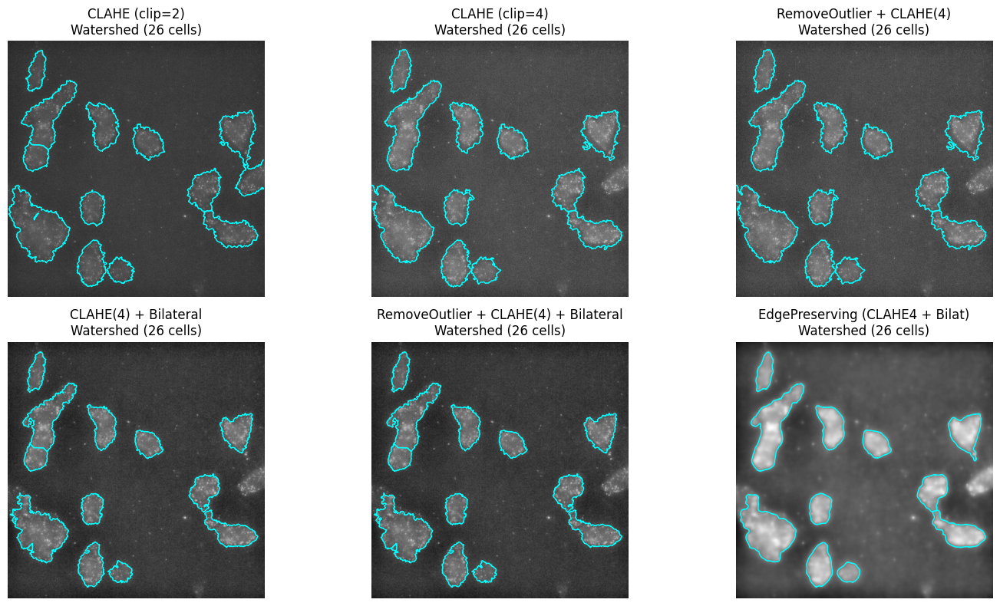

In [27]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import estimate_sigma
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------
def remove_outliers(img, k=20.0, use_median=False):
    x = img.astype(np.float32)
    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad
        thresh = med + k * sigma
    else:
        mean = np.mean(x)
        std = np.std(x)
        thresh = mean + k * std
    x_clipped = np.minimum(x, thresh)
    x_norm = (x_clipped - x_clipped.min()) / (x_clipped.max() - x_clipped.min() + 1e-6)
    return x_norm

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def calculate_sigma(img):
    sig = estimate_sigma(img, channel_axis=None, average_sigmas=True)
    print(f'Estimated Gaussian noise std = {sig:.4f}')
    return sig

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)
    return cyt_blended

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load image (replace with your path)
# --------------------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s006.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s006.tif" 

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray()

with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

# Dummy bounding boxes from your nucleus detector
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

cyt_removed = remove_outliers(cyt)
cyt_norm = normalize_to_uint8(cyt_removed)

# --------------------------------------
# Define filter variants
# --------------------------------------
variants = {
    "CLAHE (clip=2)": clahe_filter(cyt_norm, clip_limit=2),
    "CLAHE (clip=4)": clahe_filter(cyt_norm, clip_limit=4),
    "RemoveOutlier + CLAHE(4)": clahe_filter(normalize_to_uint8(remove_outliers(cyt)), clip_limit=4),
    "CLAHE(4) + Bilateral": cv2.bilateralFilter(clahe_filter(cyt_norm, clip_limit=4), d=9, sigmaColor=75, sigmaSpace=15),
    "RemoveOutlier + CLAHE(4) + Bilateral": cv2.bilateralFilter(
        clahe_filter(normalize_to_uint8(remove_outliers(cyt)), clip_limit=4), d=9, sigmaColor=75, sigmaSpace=15),
    "EdgePreserving (CLAHE4 + Bilat)": cv2.edgePreservingFilter(
        cv2.bilateralFilter(clahe_filter(normalize_to_uint8(remove_outliers(cyt)), clip_limit=4),
                            d=9, sigmaColor=75, sigmaSpace=15), flags=1, sigma_s=50, sigma_r=0.4)
}

# --------------------------------------
# Compute Watershed + SAM masks
# --------------------------------------
results = {}
for name, img in variants.items():
    print(f"Processing {name} ...")
    ws_masks = watershed_segment_with_centers(img, centers)

    results[name] = {"img": img, "ws": ws_masks}

# --------------------------------------
# Visualization (10 plots)
# --------------------------------------
import math

# Example: 3 columns
ncols = 3
nrows = math.ceil(len(variants) / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
axes = axes.flatten()  # flatten to index easily

for i, (name, data) in enumerate(results.items()):
    img, ws_masks = data["img"], data["ws"]

    ax = axes[i]
    ax.imshow(img, cmap='gray')
    ax.set_title(f"{name}\nWatershed ({len(ws_masks)} cells)")
    ax.axis('off')

    for mask in ws_masks:
        for contour in measure.find_contours(mask, 0.5):
            ax.plot(contour[:, 1], contour[:, 0], color='cyan', linewidth=1)

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


DEBUG: Running dino_bbox


DEBUG: DINO predicted 45 boxes


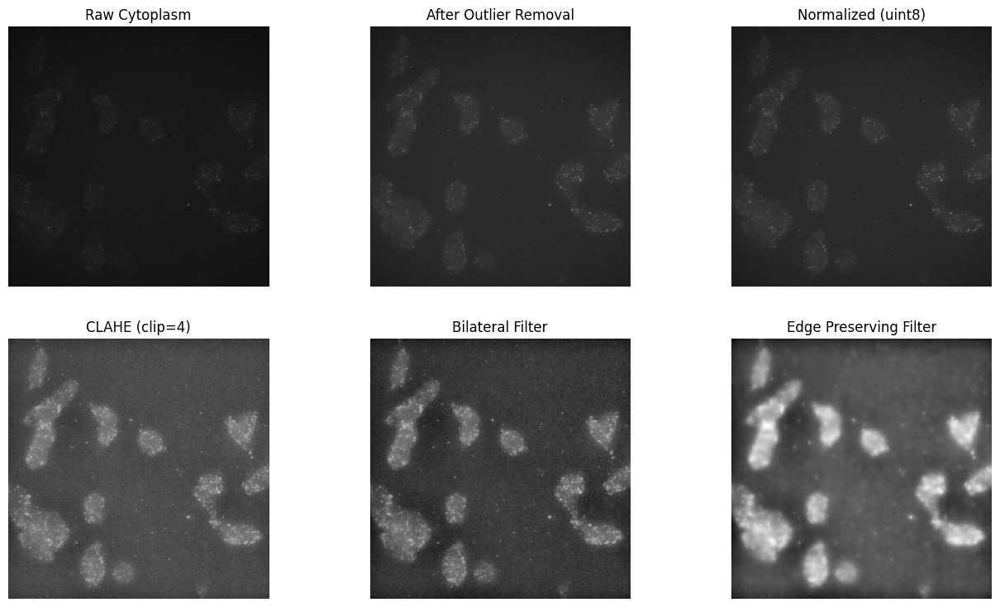

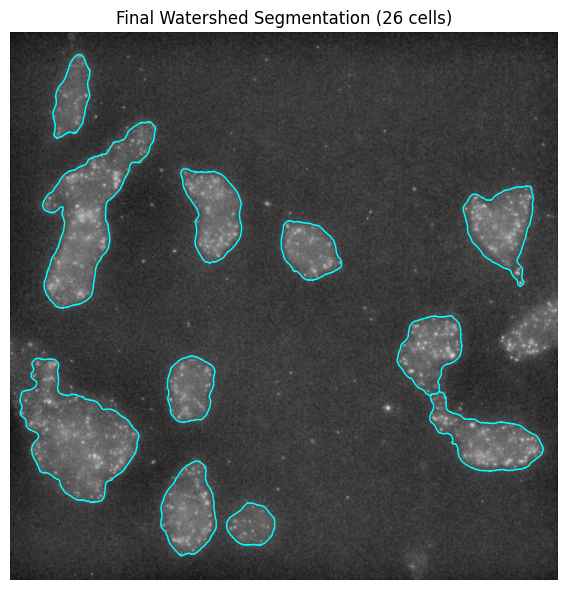

In [29]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi

# --------------------------------------
# Helper functions
# --------------------------------------
def remove_outliers(img, k=20.0):
    x = img.astype(np.float32)
    mean, std = np.mean(x), np.std(x)
    thresh = mean + k * std
    x_clipped = np.minimum(x, thresh)
    x_norm = (x_clipped - x_clipped.min()) / (x_clipped.max() - x_clipped.min() + 1e-6)
    return x_norm

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return clahe.apply(img)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load images (replace paths)
# --------------------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s006.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s006.tif"

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray()
with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

# Dummy nuclei centers (replace with DINO output)
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2)/2, (y1 + y2)/2) for x1, y1, x2, y2 in bbox_nucleus]

# --------------------------------------
# Step-by-step processing
# --------------------------------------
cyt_orig = cyt
cyt_outliers = remove_outliers(cyt)
cyt_uint8 = normalize_to_uint8(cyt_outliers)
cyt_clahe = clahe_filter(cyt_uint8, clip_limit=4)
cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=75, sigmaSpace=15)
cyt_edgepres = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=50, sigma_r=0.4)

# Watershed segmentation
masks = watershed_segment_with_centers(cyt_edgepres, centers)

# --------------------------------------
# Visualization
# --------------------------------------
steps = [
    ("Raw Cytoplasm", cyt_orig),
    ("After Outlier Removal", cyt_outliers),
    ("Normalized (uint8)", cyt_uint8),
    ("CLAHE (clip=4)", cyt_clahe),
    ("Bilateral Filter", cyt_bilat),
    ("Edge Preserving Filter", cyt_edgepres),
]

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes = axes.flatten()

for i, (title, img) in enumerate(steps):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(title)
    axes[i].axis('off')

# Last plot: watershed overlay
fig2, ax2 = plt.subplots(figsize=(6,6))
ax2.imshow(cyt_bilat, cmap='gray')
for mask in masks:
    for contour in measure.find_contours(mask, 0.5):
        ax2.plot(contour[:, 1], contour[:, 0], color='cyan', linewidth=1)
ax2.set_title(f"Final Watershed Segmentation ({len(masks)} cells)")
ax2.axis('off')

plt.tight_layout()
plt.show()


### Testing Bilat Parameters

DEBUG: Running dino_bbox
DEBUG: DINO predicted 46 boxes
Sweep finished over 27 combos in 202.66s
                     name  n_cells     avg_area  median_area  total_area
 bilat d=13, sc=40, ss=20       21 42362.523810      36703.0      889613
 bilat d=13, sc=40, ss=30       21 42368.714286      36703.0      889743
 bilat d=13, sc=40, ss=10       21 42266.523810      36706.0      887597
  bilat d=9, sc=40, ss=30       21 42264.190476      36826.0      887548
  bilat d=9, sc=40, ss=10       21 42254.761905      36841.0      887350
  bilat d=9, sc=40, ss=20       21 42274.190476      36841.0      887758
  bilat d=5, sc=40, ss=10       20 43736.650000      41917.5      874733
  bilat d=5, sc=40, ss=20       20 43729.750000      41917.5      874595
  bilat d=5, sc=40, ss=30       20 43737.450000      41917.5      874749
 bilat d=5, sc=110, ss=10       19 44920.842105      47027.0      853496
 bilat d=5, sc=110, ss=20       19 44920.210526      47096.0      853484
 bilat d=5, sc=110, ss=30  

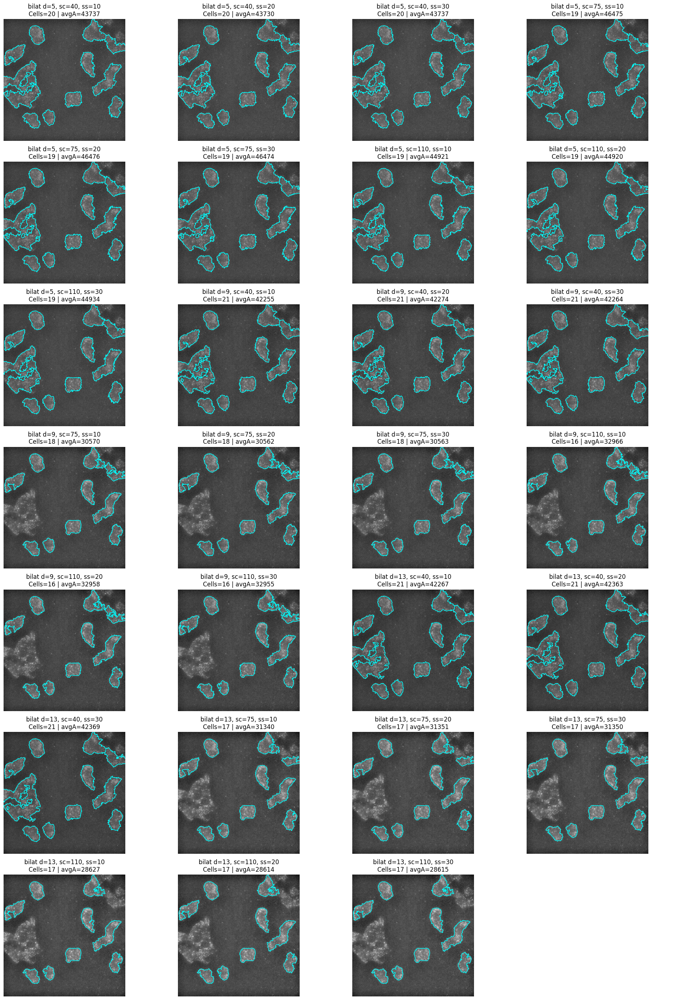

In [55]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from itertools import product
import math
import pandas as pd
from time import time

# -----------------------------
# Helper functions (same as before)
# -----------------------------
def remove_outliers(img, k=20.0, use_median=False):
    x = img.astype(np.float32)
    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad
        thresh = med + k * sigma
    else:
        mean = np.mean(x)
        std = np.std(x)
        thresh = mean + k * std
    x = np.minimum(x, thresh)
    return (x - x.min()) / (x.max() - x.min() + 1e-6)

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def watershed_segment_with_centers(cyt_img, centers, edge_weight=5.0, area_hole=1000):
    # threshold foreground (feel free to swap Otsu with Yen/Triangle later)
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=area_hole)

    # distance map
    dist = ndi.distance_transform_edt(binary)

    # nucleus seeds
    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    # elevation blends distance (favor interiors) and edges (discourage crossing)
    edges = filters.sobel(cyt_img)
    elevation = -dist + edge_weight * edges

    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels) + 1):
        mask = (labels == i)
        if np.any(mask):
            masks.append(postproc_mask(mask))
    return masks

def masks_stats(masks):
    if not masks:
        return {"n_cells": 0, "avg_area": 0.0, "median_area": 0.0, "total_area": 0}
    areas = [int(m.sum()) for m in masks]
    return {
        "n_cells": len(areas),
        "avg_area": float(np.mean(areas)),
        "median_area": float(np.median(areas)),
        "total_area": int(np.sum(areas)),
    }

# -----------------------------
# Load images (set your paths)
# -----------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s002.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s002.tif"

with tifffile.TiffFile(cyt_path) as tif:
    cyt_raw = tif.pages[0].asarray()
with tifffile.TiffFile(nuc_path) as tif:
    nuc = tif.pages[0].asarray()

# nucleus detector -> centers (replace with your wrapper)
bbox_nucleus = f.AppIntDINOwrapper(nuc)  # returns list of (x1,y1,x2,y2)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# -----------------------------
# Fixed upstream preprocessing
# (We'll hold these constant during the bilateral sweep)
# -----------------------------
UPSTREAM = {
    "remove_outliers": {"k": 20.0, "use_median": False},
    "clahe": {"clip_limit": 4.0, "tile_size": (8, 8)},
    "edge_weight": 5.0,     # watershed elevation weight for edges
    "area_hole": 1000       # min area considered a hole to fill
}

cyt_base = remove_outliers(cyt_raw, **UPSTREAM["remove_outliers"])
cyt_base = normalize_to_uint8(cyt_base)
cyt_base = clahe_filter(cyt_base, **UPSTREAM["clahe"])

# -----------------------------
# Bilateral parameter grid
# Start with a modest grid; expand as needed
# -----------------------------
d_values = [5, 9, 13]                # neighborhood diameter
sigmaColor_values = [40, 75, 110]    # intensity domain
sigmaSpace_values = [10, 20, 30]     # spatial domain

param_grid = list(product(d_values, sigmaColor_values, sigmaSpace_values))

# -----------------------------
# Run sweep
# -----------------------------
results = []
images = {}

t0 = time()
for (d, sigC, sigS) in param_grid:
    name = f"bilat d={d}, sc={sigC}, ss={sigS}"

    # 1) bilateral
    img_bilat = cv2.bilateralFilter(cyt_base, d=d, sigmaColor=sigC, sigmaSpace=sigS)

    # 2) watershed with fixed downstream params
    masks = watershed_segment_with_centers(
        img_bilat, centers,
        edge_weight=UPSTREAM["edge_weight"],
        area_hole=UPSTREAM["area_hole"]
    )

    # 3) stats
    stat = masks_stats(masks)
    stat.update({"name": name, "d": d, "sigmaColor": sigC, "sigmaSpace": sigS})
    results.append((name, img_bilat, masks, stat))
    images[name] = {"img": img_bilat, "masks": masks}

t1 = time()
print(f"Sweep finished over {len(param_grid)} combos in {t1 - t0:.2f}s")

# -----------------------------
# Tabular summary (sorted by n_cells desc, then median_area asc)
# -----------------------------
df = pd.DataFrame([r[3] for r in results])
df = df.sort_values(["n_cells", "median_area"], ascending=[False, True]).reset_index(drop=True)
print(df[["name", "n_cells", "avg_area", "median_area", "total_area"]].to_string(index=False))

# -----------------------------
# Visualization grid
# -----------------------------
n = len(results)
ncols = 4  # change to 3/4 depending on your screen
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
axes = axes.flatten()

for i, (name, img_bilat, masks, stat) in enumerate(results):
    ax = axes[i]
    ax.imshow(img_bilat, cmap='gray')
    # overlay contours
    for m in masks:
        for c in measure.find_contours(m, 0.5):
            ax.plot(c[:, 1], c[:, 0], color='cyan', linewidth=1)
    ax.set_title(f"{name}\nCells={stat['n_cells']} | avgA={stat['avg_area']:.0f}")
    ax.axis('off')

# Hide empty panels
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


### Testing Sigma Estimate

Estimated σ = 31.03
DEBUG: Running dino_bbox
DEBUG: DINO predicted 46 boxes

[TEST] σ_offset=-10, σ_norm=21.03

[TEST] σ_offset=-5, σ_norm=26.03

[TEST] σ_offset=+0, σ_norm=31.03

[TEST] σ_offset=+3, σ_norm=34.03

[TEST] σ_offset=+10, σ_norm=41.03

[TEST] σ_offset=+20, σ_norm=51.03


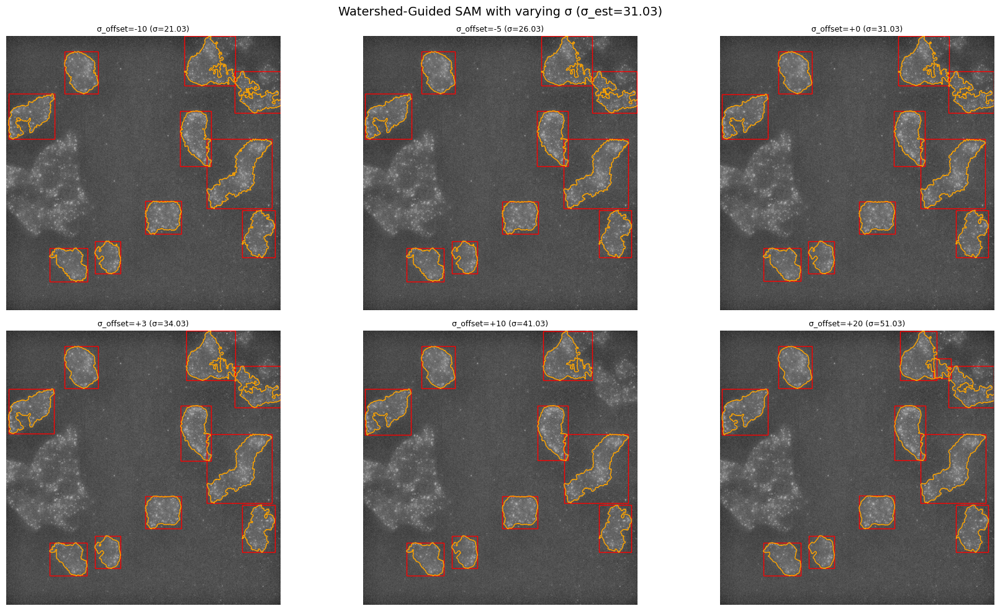

In [39]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import estimate_sigma

# --------------------------------------
# Helper functions (identical)
# --------------------------------------
def remove_outliers(img, k=20.0, use_median=False):
    x = img.astype(np.float32)
    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad
        thresh = med + k * sigma
    else:
        mean, std = np.mean(x), np.std(x)
        thresh = mean + k * std
    x_clipped = np.minimum(x, thresh)
    return (x_clipped - x_clipped.min()) / (x_clipped.max() - x_clipped.min() + 1e-6)

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)
    return cyt_blended

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load images
# --------------------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s002.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s002.tif"

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray()
with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

# --------------------------------------
# Preprocessing (exactly same)
# --------------------------------------
cyt_removed = remove_outliers(cyt)
cyt_norm = normalize_to_uint8(cyt_removed)
cyt_clahe = clahe_filter(cyt_norm)

sigma_est = estimate_sigma(cyt_clahe, channel_axis=None, average_sigmas=True)
print(f"Estimated σ = {sigma_est:.2f}")

# Get nucleus bounding boxes and centers from your DINO model
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# --------------------------------------
# Try different sigma offsets
# --------------------------------------
sigma_offsets = [-10, -5, 0, +3, +10, +20]
results = {}

for off in sigma_offsets:
    sigma_norm = sigma_est + off
    sigma_weak = sigma_est - 10.0  # keep consistent with your original logic

    print(f"\n[TEST] σ_offset={off:+}, σ_norm={sigma_norm:.2f}")

    # --- identical processing
    cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15, borderType=cv2.BORDER_REFLECT_101)
    cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)
    cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)
    cyt_blended = laplacian(cyt_norm, cyt_bilat)
    cyt_rgb = np.stack([cyt_blended, cyt_bilat, cyt_edge_preserved], axis=-1)

    # --- watershed + SAM (same params)
    masks_bilat_edge = watershed_segment_with_centers(cyt_bilat_edge, centers)
    bbox_cyto = [mask_to_bbox(m) for m in masks_bilat_edge]
    bbox_cyto = [b for b in bbox_cyto if b is not None]
    bbox_cyto = [[float(x1), float(y1), float(x2), float(y2)] for (x1, y1, x2, y2) in bbox_cyto]

    results[f"σ_offset={off:+} (σ={sigma_norm:.2f})"] = (cyt_clahe, bbox_cyto, masks_bilat_edge)

# --------------------------------------
# Visualization
# --------------------------------------
ncols = 3
nrows = int(np.ceil(len(results) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
axes = axes.flatten()

for ax, (label, (cyt_clahe, bbox_cyto, masks_bilat_edge)) in zip(axes, results.items()):
    ax.imshow(cyt_clahe, cmap='gray')
    for (x1, y1, x2, y2) in bbox_cyto:
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', lw=1))
    for mask in masks_bilat_edge:
        for contour in measure.find_contours(mask, 0.5):
            ax.plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    ax.set_title(label, fontsize=9)
    ax.axis('off')

for j in range(len(results), len(axes)):
    axes[j].axis('off')

plt.suptitle(f"Watershed-Guided SAM with varying σ (σ_est={sigma_est:.2f})", fontsize=14)
plt.tight_layout()
plt.show()



### Testing remove_small_holes

Estimated Gaussian noise standard deviation = 8.89870092251892
Estimated Gaussian noise standard deviation = 31.476425342244003
DEBUG: Running dino_bbox
DEBUG: DINO predicted 28 boxes


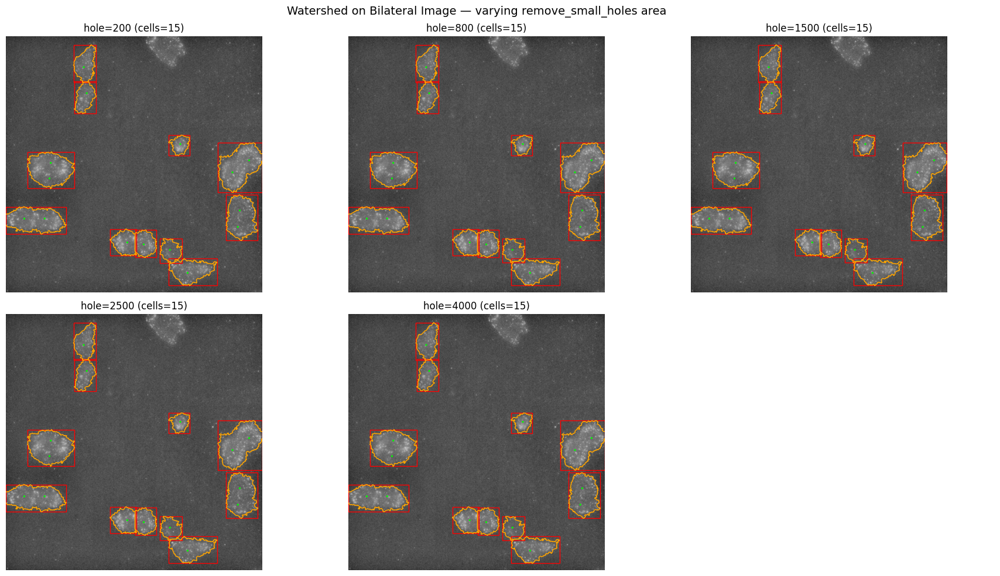

In [54]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import estimate_sigma
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------
def remove_outliers(img, k=20.0, use_median=False):
    """
    Clip values that are more than k std-dev (or MAD units) above center.
    Returns clipped float32 image in [0,1].
    """
    x = img.astype(np.float32)
    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad
        thresh = med + k * sigma
    else:
        mean = np.mean(x)
        std = np.std(x)
        thresh = mean + k * std
    x_clipped = np.minimum(x, thresh)
    return (x_clipped - x_clipped.min()) / (x_clipped.max() - x_clipped.min() + 1e-6)

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def calculate_sigma(img):
    sig = estimate_sigma(img, channel_axis=None, average_sigmas=True)
    print(f"Estimated Gaussian noise standard deviation = {sig}")
    return sig

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)
    return cyt_blended

def brightness(img, target_mean=70):
    mean_val = np.mean(img)
    offset = target_mean - mean_val
    adjustment = np.full(img.shape, offset, dtype=np.uint8) if offset > 0 else np.zeros_like(img)
    if offset > 0:
        print("Brightness increased")
        result = cv2.add(img, adjustment)
    else:
        result = img
    return result

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

# ✅ only modification: add parameter to hole_area
def watershed_segment_with_centers(cyt_img, centers, hole_area=1000):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh

    # <--- INSERT HERE
    dist_fg = ndi.distance_transform_edt(binary)
    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if not (0 <= yi < binary.shape[0] and 0 <= xi < binary.shape[1]):
            continue
        if not binary[yi, xi]:
            # move seed to nearest foreground pixel
            yy, xx = np.unravel_index(np.argmax(dist_fg), dist_fg.shape)
            xi, yi = int(xx), int(yy)
        markers[yi, xi] = i
    # <--- END INSERTION

    # ✅ the ONLY changed line
    binary = morphology.remove_small_holes(binary, area_threshold=hole_area)
    # binary = morphology.remove_small_objects(binary, min_size=1000)

    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s004.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s004.tif"

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray()
with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

cyt_removed = remove_outliers(cyt)
cyt_norm = normalize_to_uint8(cyt_removed)

sigma_est = calculate_sigma(cyt)
cyt_clahe = clahe_filter(cyt_norm)

sigma_est = calculate_sigma(cyt_clahe)
sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

cyt_bilat = cv2.bilateralFilter(
    cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15,
    borderType=cv2.BORDER_REFLECT_101
)
cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)
cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)
cyt_blended = laplacian(cyt_norm, cyt_bilat)

# --------
# DINO nucleus detection (same as before)
# --------
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# --------------------------------------
# Test different remove_small_holes values
# --------------------------------------
hole_areas = [200, 800, 1500, 2500, 4000]
results = {}

for area in hole_areas:
    masks_bilat_edge = watershed_segment_with_centers(cyt_bilat, centers, hole_area=area)
    bbox_cyto = [mask_to_bbox(m) for m in masks_bilat_edge]
    bbox_cyto = [b for b in bbox_cyto if b is not None]
    bbox_cyto = [[float(x1), float(y1), float(x2), float(y2)] for (x1, y1, x2, y2) in bbox_cyto]
    results[f"hole={area} (cells={len(masks_bilat_edge)})"] = (cyt_bilat, bbox_cyto, masks_bilat_edge)

# --------------------------------------
# Visualization
# --------------------------------------
ncols = 3
nrows = int(np.ceil(len(results) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
axes = axes.flatten()

for ax, (label, (cyt_bilat, bbox_cyto, masks)) in zip(axes, results.items()):
    ax.imshow(cyt_bilat, cmap='gray', vmin=0, vmax=255)
    for (x1, y1, x2, y2) in bbox_cyto:
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1,
                               edgecolor='red', facecolor='none', lw=1))
    for mask in masks:
        for contour in measure.find_contours(mask, 0.5):
            ax.plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    # lime nucleus centers
    for (cx, cy) in centers:
        ax.add_patch(Circle((cx, cy), radius=4, color='lime', fill=True))
    ax.set_title(label)
    ax.axis('off')

for j in range(len(results), len(axes)):
    axes[j].axis('off')

plt.suptitle("Watershed on Bilateral Image — varying remove_small_holes area", fontsize=14)
plt.tight_layout()
plt.show()



### Testing Different Threshold

In [62]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import estimate_sigma

# --------------------------------------
# Helper functions (unchanged)
# --------------------------------------
def remove_outliers(img, k=20.0, use_median=False):
    x = img.astype(np.float32)
    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad
        thresh = med + k * sigma
    else:
        mean, std = np.mean(x), np.std(x)
        thresh = mean + k * std
    x = np.minimum(x, thresh)
    return (x - x.min()) / (x.max() - x.min() + 1e-6)

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def calculate_sigma(img):
    sig = estimate_sigma(img, channel_axis=None, average_sigmas=True)
    print(f"[INFO] Estimated Gaussian noise σ = {sig:.2f}")
    return sig

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    return cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

# --------------------------------------
# Watershed with variable threshold method
# --------------------------------------
def watershed_segment_with_centers(cyt_img, centers, threshold_method="otsu", hole_area=1000):
    # 🔹 TESTING: Different thresholding methods
    if threshold_method == "otsu":
        thresh = filters.threshold_otsu(cyt_img)
    elif threshold_method == "yen":
        thresh = filters.threshold_yen(cyt_img)
    elif threshold_method == "triangle":
        thresh = filters.threshold_triangle(cyt_img)
    elif threshold_method == "li":
        thresh = filters.threshold_li(cyt_img)
    elif threshold_method == "mean":
        thresh = np.mean(cyt_img)
    elif threshold_method == "isodata":
        thresh = filters.threshold_isodata(cyt_img)
    else:
        raise ValueError(f"Unknown threshold method: {threshold_method}")

    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=hole_area)

    dist = ndi.distance_transform_edt(binary)
    markers = np.zeros(cyt_img.shape, dtype=np.int32)

    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load and preprocess (unchanged)
# --------------------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s001.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s001.tif"

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray()
with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

cyt_removed = remove_outliers(cyt)
cyt_norm = normalize_to_uint8(cyt_removed)
sigma_est = calculate_sigma(cyt)
cyt_clahe = clahe_filter(cyt_norm)

sigma_est = calculate_sigma(cyt_clahe)
sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

cyt_bilat = cv2.bilateralFilter(
    cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15,
    borderType=cv2.BORDER_REFLECT_101
)
cyt_blended = laplacian(cyt_norm, cyt_bilat)

# --- Real DINO centers (keep unchanged)
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# --------------------------------------
# Test different threshold methods
# --------------------------------------
threshold_methods = ["otsu", "yen", "triangle", "li", "mean", "isodata"]
results = {}

for method in threshold_methods:
    masks = watershed_segment_with_centers(cyt_bilat, centers, threshold_method=method, hole_area=1000)
    bbox_cyto = [mask_to_bbox(m) for m in masks if mask_to_bbox(m) is not None]
    results[f"{method} (cells={len(masks)})"] = (cyt_bilat, bbox_cyto, masks)

# --------------------------------------
# Visualization
# --------------------------------------
ncols = 3
nrows = int(np.ceil(len(results) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
axes = axes.flatten()

for ax, (label, (cyt_bilat, bbox_cyto, masks)) in zip(axes, results.items()):
    ax.imshow(cyt_bilat, cmap='gray', vmin=0, vmax=255)
    for (x1, y1, x2, y2) in bbox_cyto:
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1,
                               edgecolor='red', facecolor='none', lw=1))
    for mask in masks:
        for contour in measure.find_contours(mask, 0.5):
            ax.plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    for (cx, cy) in centers:
        ax.add_patch(Circle((cx, cy), radius=4, color='lime', fill=True))
    ax.set_title(label)
    ax.axis('off')

for j in range(len(results), len(axes)):
    axes[j].axis('off')

plt.suptitle("Watershed on Bilateral Image — varying threshold methods", fontsize=14)
plt.tight_layout()
plt.show()


[INFO] Estimated Gaussian noise σ = 9.58
[INFO] Estimated Gaussian noise σ = 31.30


AttributeError: module 'fishCore' has no attribute 'AppIntDINOwrapper'

### Testing by seeding nucleus mask to watershed

[INFO] Estimated Gaussian noise σ = 9.58
[INFO] Estimated Gaussian noise σ = 31.30
DEBUG: Running dino_bbox
DEBUG: DINO predicted 55 boxes
Found BBox to use...


[2025-10-25 16:33:29,535][INFO] PRED: generated 25 masks


[CYTO] Starting prediction for 24 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [459.0, 0.0, 649.0, 250.0]
[CYTO] Processing box [465.0, 234.0, 737.0, 392.0]
[CYTO] Processing box [308.0, 212.0, 497.0, 502.0]
[CYTO] Processing box [479.0, 334.0, 755.0, 506.0]
[CYTO] Processing box [1621.0, 343.0, 1857.0, 570.0]
[CYTO] Processing box [668.0, 406.0, 877.0, 661.0]
[CYTO] Processing box [865.0, 399.0, 1102.0, 686.0]
[CYTO] Processing box [1746.0, 443.0, 1971.0, 677.0]
[CYTO] Processing box [1832.0, 557.0, 2047.0, 1037.0]
[CYTO] Processing box [743.0, 799.0, 953.0, 1006.0]
[CYTO] Processing box [853.0, 876.0, 1088.0, 1090.0]
[CYTO] Processing box [374.0, 888.0, 586.0, 1100.0]
[CYTO] Processing box [324.0, 914.0, 407.0, 1074.0]
[CYTO] Processing box [1783.0, 1110.0, 2047.0, 1389.0]
[CYTO] Processing box [837.0, 1154.0, 1059.0, 1430.0]
[CYTO] Processing box [1803.0, 1342.0, 2047.0, 1606.0]
[CYTO] Processin

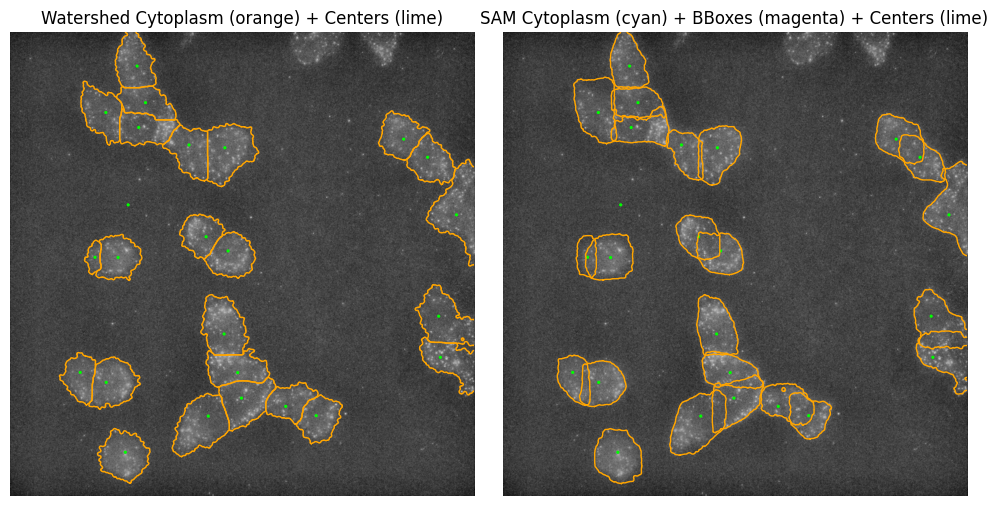

In [7]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import estimate_sigma
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------
def remove_outliers(img, k=20.0, use_median=False):
    x = img.astype(np.float32)
    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad
        thresh = med + k * sigma
    else:
        mean, std = np.mean(x), np.std(x)
        thresh = mean + k * std
    x = np.minimum(x, thresh)
    return (x - x.min()) / (x.max() - x.min() + 1e-6)

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def calculate_sigma(img):
    sig = estimate_sigma(img, channel_axis=None, average_sigmas=True)
    print(f"[INFO] Estimated Gaussian noise σ = {sig:.2f}")
    return sig

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    return cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=500)
    m = morphology.binary_closing(m, footprint=morphology.disk(5))
    m = morphology.binary_opening(m, footprint=morphology.disk(5))
    return m.astype(np.uint8)

def mask_to_bbox(mask, pad=5, relative=False):
    """
    Compute bounding box of a binary mask, optionally expanded.

    Parameters
    ----------
    mask : np.ndarray
        Binary mask.
    pad : int or float
        If `relative=False`, number of pixels to pad each side.
        If `relative=True`, fraction of width/height (e.g., 0.1 = 10% larger).
    relative : bool
        Whether to interpret pad as fraction instead of pixels.
    """
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None

    x1, y1, x2, y2 = xs.min(), ys.min(), xs.max(), ys.max()

    # Apply padding
    if relative:
        w, h = x2 - x1, y2 - y1
        pad_x = w * pad
        pad_y = h * pad
    else:
        pad_x = pad
        pad_y = pad

    # Expand and clip to image size
    x1e = max(0, x1 - pad_x)
    y1e = max(0, y1 - pad_y)
    x2e = min(mask.shape[1] - 1, x2 + pad_x)
    y2e = min(mask.shape[0] - 1, y2 + pad_y)

    return (float(x1e), float(y1e), float(x2e), float(y2e))


def watershed_segment_with_mask(cyt_img, nucleus_mask):
    """Watershed segmentation using SAM nucleus masks as markers."""
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    dist = ndi.distance_transform_edt(binary)

    # use labeled nucleus masks as watershed markers
    markers = measure.label(nucleus_mask)

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------
cyt_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w3-AF594_s001.tif"
nuc_path = r"C:\Users\tkpp2\Documents\FISH-ML2\assets\guohao_594\EXP250921COLB01\MAXEXP250921COLB01_w1-DAPI_s001.tif"

with tifffile.TiffFile(cyt_path) as tif:
    cyt = tif.pages[0].asarray()
with tifffile.TiffFile(nuc_path) as tif:
    nucleus = tif.pages[0].asarray()

cyt_removed = remove_outliers(cyt)
cyt_norm = normalize_to_uint8(cyt_removed)
sigma_est = calculate_sigma(cyt)
cyt_clahe = clahe_filter(cyt_norm)

sigma_est = calculate_sigma(cyt_clahe)
sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15, borderType=cv2.BORDER_REFLECT_101)
cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)
cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)
cyt_blended = laplacian(cyt_norm, cyt_bilat)

# --------------------------------------
# DINO + SAM nucleus segmentation
# --------------------------------------
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]
nuc_masks_all = f.finetune.AppIntPREDICTwrapper(nucleus, bbox_nucleus)  # nucleus SAM model
nucleus_masks = [postproc_mask(m) for m in nuc_masks_all]               # each m is 2D

# --------------------------------------
# Cytoplasm segmentation using nucleus masks as seeds
# --------------------------------------
# combine separate binary nucleus masks into one labeled marker mask
nucleus_marker_mask = np.zeros_like(nucleus, dtype=np.uint8)
for i, nm in enumerate(nucleus_masks, start=1):
    nucleus_marker_mask[nm > 0] = i

# now call watershed
cyt_masks = watershed_segment_with_mask(cyt_bilat, nucleus_marker_mask)
bbox_cyto = [mask_to_bbox(m) for m in cyt_masks]
bbox_cyto = [b for b in bbox_cyto if b is not None]
bbox_cyto = [
    [float(x1), float(y1), float(x2), float(y2)] 
    for (x1, y1, x2, y2) in bbox_cyto
]

# -----------------------------
# SAM segmentation guided by boxes
# -----------------------------
cyt_rgb = np.stack([cyt_blended, cyt_bilat, cyt_edge_preserved], axis=-1)
masks_all = f.finetune.AppIntPREDICTCytoplasmWrapper(cyt_rgb, bbox_cyto)

masks = []
for mset in masks_all:
    areas = [(mm > 0).sum() for mm in mset]
    best = mset[np.argmax(areas)]
    masks.append(postproc_mask(best))

# --------------------------------------
# Visualization: Watershed vs SAM
# --------------------------------------
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# choose a reasonable background to display under overlays
# (bilateral tends to look clean; you could also try cyt_blended)
bg = cyt_bilat

# ------------------------
# LEFT: Watershed Results
# ------------------------
ax[0].set_title("Watershed Cytoplasm (orange) + Centers (lime)")
ax[0].imshow(bg, cmap='gray')            # <-- add background image
ax[0].axis('off')

# Plot watershed mask contours
for m in cyt_masks:
    for contour in measure.find_contours(m, 0.5):
        ax[0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# Plot nucleus centers
for (cx, cy) in centers:
    ax[0].add_patch(Circle((cx, cy), radius=4, color='lime', fill=True))

# ------------------------
# RIGHT: SAM Results
# ------------------------
ax[1].set_title("SAM Cytoplasm (cyan) + BBoxes (magenta) + Centers (lime)")
ax[1].imshow(bg, cmap='gray')            # <-- add background image
ax[1].axis('off')

# Plot SAM mask contours
for m in masks:
    for contour in measure.find_contours(m, 0.5):
        ax[1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')


# Plot nucleus centers
for (cx, cy) in centers:
    ax[1].add_patch(Circle((cx, cy), radius=4, color='lime', fill=True))

plt.tight_layout()
plt.show()

